# Problem 1:

**We have written the function mc prediction in rl/monte carlo.py as an implementation of MonteCarlo Prediction with function approximation. You have also learnt that since Tabular MC Prediction is a special case of MC Prediction with Function Approximation and so, writing a separate
function for Tabular MC Prediction is not necessary. But for a learning experience, it’s a great idea
to write a function for Tabular MC Prediction from scratch. Think about what the input and
output types must be. Be sure to reduce the learning rate appropriately as a function of number
of updates (or as a function of number of episodes).**

Alright, so before I begin the coding part of this problem, I want to make sure that I understand exactly what I need to do to properly implement a function for Tabular MC Prediction. 

# ***********Using Vampire Problem for Testing***********:


In [11]:
#Import Modules:
import sys
sys.path.append("../../RL-book")
from dataclasses import dataclass
from typing import Tuple, Dict
from typing import Iterable, Iterator, Tuple, TypeVar
from rl.markov_decision_process import FiniteMarkovDecisionProcess, MarkovDecisionProcess
from rl.markov_decision_process import FinitePolicy, StateActionMapping
from rl.markov_process import FiniteMarkovProcess, FiniteMarkovRewardProcess
from rl.distribution import Categorical, Constant
from scipy.stats import poisson
import numpy as np
from more_itertools import distinct_permutations
import matplotlib.pyplot as plt
from rl.dynamic_programming import value_iteration, policy_iteration, policy_iteration_result
import rl.markov_process as mp
from matplotlib.pyplot import cm

from IPython.core.display import display, HTML
display(HTML("<style>.container{width:90%!important;}"))

In [12]:
#Create Class:
@dataclass(frozen=True)
class Village_State:
    num_villagers_alive: int
    Vampire_is_alive : bool
        
VampireMapping = StateActionMapping[Village_State, int]

class Vampire_MDP_Finite(FiniteMarkovDecisionProcess[Village_State, int]):
    def __init__(self,num_villagers_alive:int):
        self.num_villagers_alive = num_villagers_alive
        super().__init__(self.get_action_transition_reward_map())
    
    def get_action_transition_reward_map(self) -> VampireMapping:
        d: Dict[Village_State, Dict[str, Categorical[Tuple[Village_State,float]]]] = {}

        for villagers in range(1,self.num_villagers_alive+1):
            START_STATE = Village_State(num_villagers_alive = villagers,Vampire_is_alive=True)
            action_dict = {}
            
            for poison_amount in range(villagers+1):
                action_str = "Poison " + str(poison_amount) + " villigers"
                END_STATE_Murdered = Village_State(num_villagers_alive = villagers-poison_amount,Vampire_is_alive=False)
                END_STATE_Survived = Village_State(num_villagers_alive = villagers-poison_amount-1,Vampire_is_alive=True)
                
                prob_dict = {}
                
                vampire_murdered_prob = poison_amount/villagers
                vampire_survive_prob = 1 - poison_amount/villagers
                
                Reward_vampire_survives = 0
                Reward_vampire_is_murdered = villagers - poison_amount
                
                prob_dict[(END_STATE_Murdered,Reward_vampire_is_murdered)] = vampire_murdered_prob
                prob_dict[(END_STATE_Survived,Reward_vampire_survives)] = vampire_survive_prob
                
                action_dict[action_str] =Categorical(prob_dict)
                
                d[END_STATE_Murdered] = None
            d[Village_State(num_villagers_alive = 0,Vampire_is_alive=True)]=None
            d[Village_State(num_villagers_alive = 0,Vampire_is_alive=False)]=None
            d[START_STATE] = action_dict
        return d
    
Vampire_MDP = Vampire_MDP_Finite(num_villagers_alive=10)

# print("MDP Transition Map")
# print("------------------")
# print(Vampire_MDP)



#### Solving This Problem:

1. Import the Vampire FiniteMDP Class that we built a while back
2. Give the MDP a policy to make it an MRP
3. Use this MRP to generate a bunch of traces
4. Write the function that implements MC solving
5. Use the function to evaluate the Value function
6. Compare it to the solution we solved for in the vampore problem workbook


In [13]:
def generate_policy_and_start_distribution(num_villagers):
    policy = {}
    start_distribution = {}
    approx_0 = {}
#     START_STATE = Village_State(num_villagers_alive = 10,Vampire_is_alive=True)
#     start_distribution[START_STATE] = 1
    for villagers in range(1,num_villagers+1):
        START_STATE = Village_State(num_villagers_alive = villagers,Vampire_is_alive=True)
        approx_0[START_STATE] = 0
        action_dict = {}
        start_distribution[START_STATE] = 1/num_villagers

        for poison_amount in range(villagers+1):
            action_str = "Poison " + str(poison_amount) + " villigers"

            #action_dict[action_str] = 1/(villagers+1)
            if poison_amount ==1:
                action_dict[action_str] = 1

            END_STATE_Murdered = Village_State(num_villagers_alive = villagers-poison_amount,Vampire_is_alive=False)
            policy[END_STATE_Murdered] = None
            approx_0[END_STATE_Murdered] = 0

        policy[START_STATE] = Categorical(action_dict)
    policy[Village_State(num_villagers_alive = 0,Vampire_is_alive=True)]=None
    policy[Village_State(num_villagers_alive = 0,Vampire_is_alive=False)]=None
    
    approx_0[Village_State(num_villagers_alive = 0,Vampire_is_alive=True)]=0
    approx_0[Village_State(num_villagers_alive = 0,Vampire_is_alive=False)]=0
    
    policy = FinitePolicy(policy)
    start_distribution = Categorical(start_distribution)
    return policy,start_distribution,approx_0

policy,start_distribution,approx_0 = generate_policy_and_start_distribution(10)
num_visits= approx_0.copy()

In [14]:
Vampire_MRP = Vampire_MDP.apply_finite_policy(policy)



In [15]:
traces = []
for i, trace in enumerate(Vampire_MRP.reward_traces(start_distribution)):

    if i >= 10000:
        break
    
    temp_list=[]
    for j,x in enumerate(trace):
        temp_list.append(x)
    
    traces.append(temp_list)
#print (traces)

for trace in traces:
    for transition in trace:
        print(transition)
    
        print ()
    print ()

TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=False), reward=7)


TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)


TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=False), reward=7)


TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0)

Tra


TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)


TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)


TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)


TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0)

Tra

TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)


TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)


TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0)

Transi

TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)


TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)


Transiti

TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)


TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)


TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)


TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0)

Tran

TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)


TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=False), reward=7)


TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)


Tra

TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)


TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0)

Transit



TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=False), reward=8)


TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=False), reward=6)


TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)


TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0)

Tr



TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)


TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=False), reward=4)


TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=False), reward=8)


TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)


TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0)

Tr

TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)


TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)


TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0)

Transit

TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=False), reward=7)


TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0)

Transit


TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=False), reward=5)


TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=False), reward=8)


TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)


TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=False), reward=6)


TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0)

T


TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=False), reward=5)


TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)


TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0)

Trans


TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)


TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)


TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)


TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0)

Tra

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)


TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)


Trans


TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)


TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)


TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0)

Transi

TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)


TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0)

TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)


Transit

In [16]:
# def generate_policy_and_start_distribution(num_villagers):
#     policy = {}
#     start_distribution = {}
#     approx_0 = {}
#     for villagers in range(1,num_villagers+1):
#         START_STATE = Village_State(num_villagers_alive = villagers,Vampire_is_alive=True)
#         approx_0[START_STATE] = 0
#         action_dict = {}
#         start_distribution[START_STATE] = 1/num_villagers

#         for poison_amount in range(villagers+1):
#             action_str = "Poison " + str(poison_amount) + " villigers"

#             action_dict[action_str] = 1/(villagers+1)

#             END_STATE_Murdered = Village_State(num_villagers_alive = villagers-poison_amount,Vampire_is_alive=False)
#             policy[END_STATE_Murdered] = None
#             approx_0[END_STATE_Murdered] = 0

#         policy[START_STATE] = Categorical(action_dict)
#     policy[Village_State(num_villagers_alive = 0,Vampire_is_alive=True)]=None
#     policy[Village_State(num_villagers_alive = 0,Vampire_is_alive=False)]=None
    
#     approx_0[Village_State(num_villagers_alive = 0,Vampire_is_alive=True)]=0
#     approx_0[Village_State(num_villagers_alive = 0,Vampire_is_alive=False)]=0
    
#     policy = FinitePolicy(policy)
#     start_distribution = Categorical(start_distribution)
#     return policy,start_distribution,approx_0

# policy,start_distribution,approx_0 = generate_policy_and_start_distribution(10)
# num_visits= approx_0.copy()

In [17]:
print (approx_0)

{Village_State(num_villagers_alive=1, Vampire_is_alive=True): 0, Village_State(num_villagers_alive=1, Vampire_is_alive=False): 0, Village_State(num_villagers_alive=0, Vampire_is_alive=False): 0, Village_State(num_villagers_alive=2, Vampire_is_alive=True): 0, Village_State(num_villagers_alive=2, Vampire_is_alive=False): 0, Village_State(num_villagers_alive=3, Vampire_is_alive=True): 0, Village_State(num_villagers_alive=3, Vampire_is_alive=False): 0, Village_State(num_villagers_alive=4, Vampire_is_alive=True): 0, Village_State(num_villagers_alive=4, Vampire_is_alive=False): 0, Village_State(num_villagers_alive=5, Vampire_is_alive=True): 0, Village_State(num_villagers_alive=5, Vampire_is_alive=False): 0, Village_State(num_villagers_alive=6, Vampire_is_alive=True): 0, Village_State(num_villagers_alive=6, Vampire_is_alive=False): 0, Village_State(num_villagers_alive=7, Vampire_is_alive=True): 0, Village_State(num_villagers_alive=7, Vampire_is_alive=False): 0, Village_State(num_villagers_ali

### Generate The Input:



In [18]:
# traces = []
# for i, trace in enumerate(Vampire_MDP.action_traces(start_distribution,policy)):

#     if i >= 100:
#         break
    
#     temp_list=[]
#     for j,x in enumerate(trace):
#         temp_list.append(x)
    
#     traces.append(temp_list)
# print (traces)


## Implement Monte Carlo Updates


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=False), reward=7)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
7

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
3
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
3

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
1
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, 

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
0
2
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
2
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_a

0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=False), reward=5)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
5

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=Fa

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
0
0
0
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=Tru

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=2, Vam

1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
0
0
0
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=Tru


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=False), reward=4)]
Transition State: Village_State(num_villagers_alive=9, Vampire_is_alive=True)
0
0
4
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
4
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
4

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_a

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_a

[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6,

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
1
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is

2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
0
0
0
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_

0
5
Approx_0: 2.757575757575758
Reward: 0
Next State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
Total Rewards: 0
Number of Visits to this state: 34

Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
5
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
5

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)



New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=False), reward=5)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
5
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
5

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6,

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
3
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
3
Transition State: Village_State(num_villagers_alive=4, Vampire_is_a

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_al


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
1
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_i

Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_a

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
3
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
3

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=2, Vam

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True)

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=False)

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_al

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=False), reward=6)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
6

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_a

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=9, Vampire_is_alive=False), reward=9)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
9
Approx_0: 2.5849056603773586
Reward: 9
Next State: Village_State(num_villagers_alive=9, Vampire_is_alive=False)
Total Rewards: 27
Number of Visits to this state: 54


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
3
Transition State: Village_State(num_villagers_alive=4, Vampire_is_ali


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=9, Vampire_is_alive=False), reward=9)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
9
Approx_0: 2.6833333333333336
Reward: 9
Next State: Village_State(num_villagers_alive=9, Vampire_is_alive=False)
Total Rewards: 36
Number of Visits to this state: 61


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=False), reward=5)]
Transition State: Village_State(num_villagers_alive=10, Vampire

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
0
1
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
1
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=Tru

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
2
Transition State: Village_State(num_villagers_alive=3, Vampire_is_ali

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=False), reward=4)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
4

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
0
0
0
0
0
Approx_0: 2.7692307692307705
Reward: 0
Next State: Village_State(num_vil

0
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
1
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_al

Reward: 0
Next State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
Total Rewards: 72
Number of Visits to this state: 87

Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
0
0
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=False), reward=8)]
Transition State: Village_State(num_villagers_alive=9, Vampire_is_alive=True)
8

New Trace:
[T

3

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=False), reward=4)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
4

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
0
2
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
2
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_a

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
0
0
0
3
Approx_0: 2.632653061224491
Reward: 0
Next State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
Total Rewards: 81
Number of Visits to this state: 99

Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=Tru

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
0
0
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
0
0
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=9, Vampire_is_alive=False), reward=9)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
9
Approx_0: 2.7053571428571432
Reward: 9
Next State: Village_State(num_villagers_alive=9, Vampire_is_alive=False)
Total Rewards: 108
Number of Visits to this state: 113


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampi

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=9, Vampire_is_alive=True)
0
0
0
0
0
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=Tr


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
2
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, 


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=False), reward=5)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
5
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
5

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=False), reward=7)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
7

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
3
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
3

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=False), reward=5)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
5

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Va

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=False), reward=7)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
7

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_a

0
1
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
0
0
0
3
Approx_0: 2.8473282442748094
Reward: 0
Next State: Village_State(num_vil

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_a

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
3
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
3
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
3

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
2
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=False), reward=7)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
7

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, 

Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=False), reward=7)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
7

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=Fals

0
5
Approx_0: 2.9383561643835603
Reward: 0
Next State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
Total Rewards: 153
Number of Visits to this state: 147

Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
5
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
5

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), rewa

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is

Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=False), reward=6)]
Transition State: Village_State(num_villagers_alive=9, Vampire_is_alive=True)
0
6
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
6

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_ali

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
0
2
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
2
Transition State: Village_State(num_villagers_alive=3, Vampire_is_a

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=False), reward=7)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
0
7
Approx_0: 2.8520710059171583
Reward: 0
Next State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
Total Rewards: 153
Number of Visits to this state: 170

Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
7

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=T


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
0
0
0
0
0
Approx_0: 2.912280701754385
Reward: 0
Next State: Village_State(num_vill

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=False), reward=6)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
6

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
3
Transition State: Village_State(num_villagers_alive=4, Va

Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
0
2
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
2
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True)

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=False), reward=5)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
5

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=False), reward=6)]
Transition State: Village_State(num_villagers_alive=7, Va

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, 

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_al

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
3
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
3
Transition State: Village_State(num_villagers_alive=4, Vampire_is_a

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_al

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
3

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=False), reward=4)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
4

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_village


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=False), reward=6)]
Transition State: Village_State(num_villagers_alive=9, Vampire_is_alive=True)
0
6
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
6

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=Tru

0
0
0
0
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
0
0
0
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=9, Vampire_is_alive=False), reward=9)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
9
Approx_0: 2.8805970149253732
Reward: 9
Next State: Village_State(num_villagers_alive=9, Vampire_is_alive=False)
Total Rewards: 198
Number of Visits to this state: 202


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_aliv


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
3
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
3

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
3
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
3
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
3

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villager

Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
0
2
Transition State: Village_State(num_villagers_alive=5, Vampire_is_al

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is

0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=False

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=False), reward=5)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
5

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_a

2
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=False), reward=5)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
0
0
5
Approx_0: 3.033333333333333
Reward: 0
Next State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
Total Rewards: 261
Number of Visits to this state: 241

Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
5
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
5

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
2
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=9, Vampire_is_alive=False), reward=9)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
9
Approx_0: 3.0566801619433193
Reward: 9
Next State: Village_State(num_villagers_alive=9, Vampire_is_alive=False)
Total Rewards: 279
Number of Visits to this state: 248


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=9, Vampire_is_alive=False), reward=9)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
9
Approx_0: 3.080645161290322
Reward: 9
Next State: Vi

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8,

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=False), reward=4)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
4

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
0
2
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
2
Transition State: Village_State(num_villagers_alive=3, Vampire_is_a

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Va

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=False), reward=6)]
Transition State: Village_State(num_villagers_alive=9, Vampire_is_alive=True)
0
6
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
6

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=False), reward=7)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
0
7
Approx_0: 3.0839694656488534
Reward: 0
Next State: Village_State(nu

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=9, Vampire_is_alive=True)
0
0
0
2
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
0
2
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
2
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=Tru

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_al

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=False), reward=6)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
6

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=False), reward=6)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
6

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_village

0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=Tr

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
3

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
2
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, 

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
0
0
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True

Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
0
0
0
3
Approx_0: 3.1866197183098577
Reward: 0
Next State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
Total Rewards: 342
Number of Visits to this sta

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
3
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
3

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
3

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_a

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Vam

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, 

Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Va

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=False), reward=4)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
4

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=False), reward=6)]
Transition State: Village_State(num_villagers_alive=9, Vampire_is_alive=True)
0
6
Transition State: Village_State(num_villagers_alive=7, Va

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_a

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=False), reward=7)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
7

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_ali

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
2
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=False), reward=6)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
6

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, 

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=9, Vampire_is_alive=False), reward=9)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
9
Approx_0: 3.1691394658753698
Reward: 9
Next State: Village_State(num_villagers_alive=9, Vampire_is_alive=False)
Total Rewards: 387
Number of Visits to this state: 338


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampir

Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
3

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
0
2
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
2
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
0
0
0
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=Tru

0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=False), reward=7)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
7

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
0
0
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True

Number of Visits to this state: 352

Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
0
1
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
1
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, 

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
0
1
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
1
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=Tru

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=False), reward=4)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
4

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villager

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
3

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8,

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
3

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=False), reward=4)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
4
Transition State: Village_State(num_villagers_alive=5, Va

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
0
0
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
1
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_i

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, V

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
0
1
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
1
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=Tru

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
3

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, 

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
0
1
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
1
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=Tru

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
0
0
0
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=Tru

3
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
3

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_aliv


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_village

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True)

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=2, Vam


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
0
0
0
0
1
Approx_0: 3.1577669902912615
Reward: 0
Next State: Village_State(num_vi

Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
0
0
0
0
1
Approx_0: 3.1726618705035965
Reward: 0
Next State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
Total Rewards: 450
Number of Visits to this state: 418

Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
0
1
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
1
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=9, Vampire_is_alive=True)
0
0
0
2
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
0
2
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
2
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=Tr

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=False

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_al

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_al

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
3

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=9, Vampire_is_alive=False), reward=9)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
9
Approx_0: 3.116279069767441
Reward: 9
Next State: Village_State(num_villagers_alive=9, Vampire_is_alive=False)
Total Rewards: 459
Number of Visits to this state: 431


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampir

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=9, Vampire_is_alive=True)
0
0
0
0
0
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=Tr

0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=Fal

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
1
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_i

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True)


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=False), reward=4)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
4
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
4

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=9, Vampire_is_alive=False), reward=9)]
Transition State: Village_State(num_villagers_alive=10,

2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=False), reward=4)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
4
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
4

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
0
0
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
0
0
0
0
1
Approx_0: 3.130620985010706
Reward: 0
Next State: Village_State(num_vill

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
0
1
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
1
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=Tru

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Va

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_al

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
0
0
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
3
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
3
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
3

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
3
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
3
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
3

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
0
0
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True)

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
0
0
0
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=Tru

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=9, Vampire_is_alive=False), reward=9)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
9
Approx_0: 3.1292246520874736
Reward: 9
Next State: Village_State(num_villagers_alive=9, Vampire_is_alive=False)
Total Rewards: 567
Number of Visits to this state: 504


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_aliv


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=False), reward=4)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
4
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
4

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
0
0
0
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=Tru

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_ali

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
0
0
0
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=Tru

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Va

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_al

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
3
Transition State: Village_State(num_villagers_alive=4, Vampire_is_ali

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
0
0
0
0
0
Approx_0: 3.127340823970036
Reward: 0
Next State: Village_State(num_villa

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=9, Vampire_is_alive=True)
0
0
0
0
0
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=Tr

0
5
Approx_0: 3.105360443622919
Reward: 0
Next State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
Total Rewards: 594
Number of Visits to this state: 542

Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
5
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
5

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), rewar

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
0
0
0
0
0
Approx_0: 3.1060329067641668
Reward: 0
Next State: Village_State(num_vill

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=9, Vampire_is_alive=True)
0
0
0
2
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
0
2
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
2
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=Tru

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=False), reward=6)]
Transition State: Village_State(num_villagers_alive=9, Vampire_is_alive=True)
0
6
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
6

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
3

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, 


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_al

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=2, Vamp

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
1
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_a

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
3
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
3

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, 

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8,

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
1
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_al

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
3

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_al

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=False), reward=4)]
Transition State: Village_State(num_villagers_alive=9, Vampire_is_alive=True)
0
0
4
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
4
Transition State: Village_State(num_villagers_alive=5, Vampire_is_a

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_a

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=False), reward=6)]
Transition State: Village_State(num_villagers_alive=7, Va

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_a

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_al

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
0
0
0
0
0
Approx_0: 3.0854271356783918
Reward: 0
Next State: Village_State(num_vill

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
0
0
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_al

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
3
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
3

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True)

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
0
0
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=9, Vampire_is_alive=True)
0
0
0
2
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
0
2
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
2
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=Tru

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_

Total Rewards: 639
Number of Visits to this state: 626

Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
7

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_i

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
0
1
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
1
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=Tru


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=False), reward=5)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
5
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
5

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=False), reward=6)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
6

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2,

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=9, Vampire_is_alive=True)
0
0
0
0
0
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=Tr

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is

Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
0
0
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=False), reward=8)]
Transition State: Village_State(num_villagers_alive=9, Vampire_is_alive=True)
8

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is

Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_a

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
3
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
3

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
0
1
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
1
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=Tru

1
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
1
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=False), reward=4)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
4
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
4

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
3

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=False), reward=5)]
Transition State: Village_State(num_villagers_

0
2
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
2
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
2
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=Fal

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=False), reward=6)]
Transition State: Village_State(num_villagers_alive=9, Vampire_is_alive=True)
0
6
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
6

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_aliv

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_al

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
1
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_a


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
3
Transition State: Village_State(num_villagers_alive=4, Vampire_is_ali

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=False


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
1
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_i

0
0
0
0
Approx_0: 3.0682148040638633
Reward: 0
Next State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
Total Rewards: 702
Number of Visits to this state: 690

Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
0
0
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=False), reward=5)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
0
0
5
Approx_0: 3.0589928057553983
Reward: 0
Next State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
Total Rewards: 702
Number of Visits to this state: 696

Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
5
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
5

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampi

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=9, Vampire_is_alive=False), reward=9)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
9
Approx_0: 3.0673352435530115
Reward: 9
Next State: Village_State(num_villagers_alive=9, Vampire_is_alive=False)
Total Rewards: 720
Number of Visits to this state: 699


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vamp

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_aliv

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
0
0
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=False), reward=4)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
4

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=9, Vampire_is_alive=False), reward=9)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
9
Approx_0: 3.082633053221291
Reward: 9
Next State: Village_State(num_villagers_alive=9, Vampire_is_alive=False)
Total Rewards: 729
Number of Visits to this state: 715


New Trace:
[TransitionStep(state=Village_State(num_vil

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_a

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
0
0
0
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=Tru


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True)

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=9, Vampire_is_al

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=False), reward=4)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
4

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=False), reward=4)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
4

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Va

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_aliv

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=False), reward=4)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
4
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
4

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=9, Vampire_is_alive=True)
0
0
0
2
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
0
2
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
2
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=Tru

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
1
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_a

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_village

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, 

3
Approx_0: 3.107856191744343
Reward: 0
Next State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
Total Rewards: 765
Number of Visits to this state: 752

Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
3
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
3
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
3

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=Tru


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
3

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
0
2
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
2
Transition State: Village_State(num_villagers_alive=3, Vampire_is_

0
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=False), reward=4)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
4
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
4

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_a

0
0
0
0
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=False), reward=5)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
0
0
5
Approx_0: 3.0926892950391665
Reward: 0
Next State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
Total Rewards: 792
Number of Visits to t

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Va

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=False), reward=6)]
Transition State: Village_State(num_villagers_alive=9, Vampire_is_alive=True)
0
6
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
6

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True)

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
0
0
0
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=Tru

0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=Tru

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
0
0
0
3
Approx_0: 3.0769230769230784
Reward: 0
Next State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
Total Rewards: 792
Number of Visits to this state: 781

Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=

3
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
3

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=False), reward=8)]
Transition State: Village_State(num_villagers_alive=9, Vampire_is_alive=True)
8

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=False), reward=4)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
4

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=False), reward=5)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
5
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
5

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7,

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
0
0
0
0
0
Approx_0: 3.0925221799746536
Reward: 0
Next State: Village_State(num_vill


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=9, Vampire_is_alive=True)
0
0
0
0
0
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=T

0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
0
1
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
3
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
3
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
3

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_i


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_i

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
0
0
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True

Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
0
0
0
3
Approx_0: 3.072749691738596
Reward: 0
Next State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
Total Rewards: 801
Number of Visits to this stat


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
1
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_a

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_a

2
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=False), reward=5)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
5
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
5

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, 

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=False), reward=7)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
7

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
1
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_a


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=False), reward=7)]
Transition State: Village_State(num_villagers_alive=8, V


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=False), reward=5)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
5

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=False), reward=7)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
7

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villag

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_a


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
0
0
0
0
1
Approx_0: 3.085816448152564
Reward: 0
Next State: Village_State(num_vil

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=9, Vampire_is_alive=True)
0
0
0
2
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
0
2
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
2
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=Tru

Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=False), reward=7)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
7

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, V


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_al

Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=False), reward=4)]
Transition State: Village_State(num_villagers_alive=9, Vampire_is_alive=True)
0
0
4
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
4
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
4

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
3

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=False), reward=7)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
7

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
3

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_village


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_ali

Transition State: Village_State(num_villagers_alive=9, Vampire_is_alive=True)
0
0
0
2
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
0
2
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
2
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_

0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=False), reward=7)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
0
7
Approx_0: 3.0543981481481493
Reward: 0
Next State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
Total Rewards: 855
Number of Visits to this state: 865

Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
7

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
2
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=False), reward=8)]
Transition State: Village_State(num_villagers_alive=9, Vampire_is_alive=True)
8

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=False), reward=7)]
Transition State: Village_State(num_villagers

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
1
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_a

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=9, Vampire_is_alive=True)
0
0
0
0
0
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=Tr

Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=False), reward=4)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
4
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
4

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_al

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
2
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Va

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
0
0
0
0
0
Approx_0: 3.0542372881355937
Reward: 0
Next State: Village_State(num_vill

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
3
Transition State: Village_State(num_villagers_alive=4, Vampire_is_ali

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
2
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, V

0
1
Approx_0: 3.0344062153163165
Reward: 0
Next State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
Total Rewards: 873
Number of Visits to this state: 902

Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
0
1
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
1
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=False), reward=6)]
Transition State: Village_State(num_villagers_alive=7, Vamp

Next State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
Total Rewards: 882
Number of Visits to this state: 905

Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
0
1
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
1
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
1
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=9, Vampire_is_alive=False), reward=9)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
9
Approx_0: 3.036464088

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True),

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vam

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=False), reward=5)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
0
0
5
Approx_0: 3.0537280701754397
Reward: 0
Next State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
Total Rewards: 900
Number of Visits to this state: 913

Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
5
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
5

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampir

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=False), reward=7)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
0
7
Approx_0: 3.0579868708971563
Reward: 0
Next State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
Total Rewards: 900
Number of Visits to this state: 915

Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
7

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=False), reward=5)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
5

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
3
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
3
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
3

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Vam

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
0
0
0
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=Tru

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
0
0
0
3
Approx_0: 3.067887931034484
Reward: 0
Next State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
Total Rewards: 909
Number of Visits to this state: 929

Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=T

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=False), reward=4)]
Transition State: Village_State(num_villagers_alive=7, Vampire_is_alive=True)
0
4
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
4

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=False), reward=7)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
7

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Va

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=10, Vampire_is_alive=True)
0
0
0
0
1
Approx_0: 3.0544871794871806
Reward: 0
Next State: Village_State(num_vil


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
2

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_i

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_alive=True)
0
0
0
0
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
3

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=8, Vampire_is_al

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=False), reward=8)]
Transition State: Village_State(num_villagers_alive=9, Vampire_is_alive=True)
8

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=False), reward=3)]
Transition State: Village_State(num_villagers_alive=6, Vampire_is_alive=True)
0
3
Transition State: Village_State(num_villagers_alive=4, Va

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, 

Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
0
0
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=7, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True),


New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=5, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=False), reward=2)]
Transition State: Village_State(num_villagers_alive=5, Vampire_is_alive=True)
0
2
Transition State: Village_State(num_villagers_alive=3, Vampire_is_ali

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, V

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=False), reward=1)]
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
1

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=9, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=False), reward=8)]
Transition State: Village_State(num_villagers_alive=9, Vampire_is_alive=True)
8

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=3, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=1, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=False), reward=0)]
Transition State: Village_State(num_villagers_alive=3, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=1, Va

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=4, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=2, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=0, Vampire_is_alive=True), reward=0)]
Transition State: Village_State(num_villagers_alive=4, Vampire_is_alive=True)
0
0
Transition State: Village_State(num_villagers_alive=2, Vampire_is_alive=True)
0

New Trace:
[TransitionStep(state=Village_State(num_villagers_alive=10, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=8, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), reward=0), TransitionStep(state=Village_State(num_villagers_alive=6, Vampire_is_alive=True), next_state=Village_State(num_villagers_alive=5, Vampire_is_alive=False

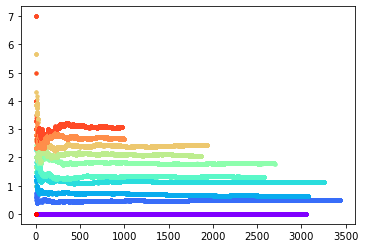

In [19]:
S = TypeVar('S')
A = TypeVar('A')
value_function = TypeVar('V')

policy,start_distribution,approx_0 = generate_policy_and_start_distribution(10)
num_visits= approx_0.copy()

#Create Function:
def mc_prediction_tabular(
    traces: Iterable[Iterable[mp.TransitionStep[S]]],
    approx_0: Dict[S,value_function],
    gamma: float,
    num_visits: Dict[S,int]) -> Dict[S,value_function]:
    
    """The main difference between this prediction and the one from the code base is that we are
        now representing the approximate value function as a dictionary. Instead of updating the function using the
        iterate updates method we will now write code to do that. The function will return a new approx_0
        that should be a better value function."""    
    
    #determine how many times we have updated a 
    Total_reward = 0
    
    #Loop through all of the individual trial runs
    for trace in traces:
        print ()
        print ("New Trace:")
        print (trace)
        
        COLOR = iter(cm.rainbow(np.linspace(0,1,len(approx_0))))
        
        #Loop through all of the individual state transitions
        total_reward = 0
        for n,transition in enumerate(trace): #SARS
            #print (transition)
            
            #Calculate the reward from this state to the end
            actual_reward = 0
            
            print ("Transition State:",transition.state)
            for i,transition_2 in enumerate(trace): #(All of the remaining steps and their rewards)
                if i >= n:
                    
                    actual_reward += gamma*transition_2.reward
                    print (actual_reward)
                    
            #Since we are in some state rn update that state with the visit number
            num_visits[transition.state] = num_visits[transition.state] + 1
                    
#             if transition.state == Village_State(num_villagers_alive = 10,Vampire_is_alive=True):
#                 print ("Actual Reward:",actual_reward)
#                 print ("Approx_0:",approx_0[transition.state])
#                 print("Number of Visits to this state:",num_visits[transition.state])
#                 print (1/(num_visits[transition.state]))
#                 print ((actual_reward - approx_0[transition.state]))
#                 #averaged_reward += 1/(num_visits[transition.state]) * (actual_reward - approx_0[transition.state])
#                 print ("Average Reward:",averaged_reward)
#                 #approx_0[transition.state] = averaged_reward
#                 print ("Updated Approx_0:",approx_0[transition.state])
#                 print ()
            
            if transition.state == Village_State(num_villagers_alive = 10,Vampire_is_alive=True):
                Total_reward += transition.reward
                print ("Approx_0:",approx_0[transition.state])
                print ("Reward:",transition.reward)
                print("Next State:",transition.next_state)
                print("Total Rewards:",Total_reward)
                print("Number of Visits to this state:",num_visits[transition.state])
                print ()
            
            #Update Value Function using the actual return
#             print (transition.state)
#             print (approx_0[transition.state])
#             print (num_visits[transition.state])
            #averaged_reward = 1/(num_visits[transition.state]) * (actual_reward - approx_0[transition.state])
#             print (averaged_reward)
            approx_0[transition.state] += 1/(num_visits[transition.state]) * (actual_reward - approx_0[transition.state])
        
        
            #plt.plot(total_steps,num_visits[transition.state],'.')
    
    
#             print (approx_0[transition.state])
#             print ()

        for x in approx_0:
            color = next(COLOR)
            if x.Vampire_is_alive:
                plt.plot(num_visits[x],approx_0[x],marker='.',color=color)
                
    return approx_0,num_visits

approx_0,num_visits = mc_prediction_tabular(traces,approx_0,1,num_visits)

print ("Value Function & Number of Rewards per Non-Terminal States")
print ()
for x in approx_0:
    if x.Vampire_is_alive:
        print (x,approx_0[x]," Number of Visits to State:",num_visits[x])


## Test Monte Carlo Update:


In [20]:
traces = []
for i, trace in enumerate(Vampire_MDP.action_traces(start_distribution,policy)):
    while tolerance > .0001:
        temp_list=[]
            for j,x in enumerate(trace):
                temp_list.append(x)

            traces.append(temp_list)    
    
    if i >= 100:
        break

        

    #Create a new trace

IndentationError: unexpected indent (<ipython-input-20-de6dde93a821>, line 5)

In [ ]:
tol = 1
traces_generator = Vampire_MDP.action_traces(start_distribution,policy)
loop_counter = 0
while tol > .001:
    approx_0_old = approx_0
    loop_counter += 1
    #Generate and store 10 traces:
    traces = []
    for i in range(10):
        temp_list=[]
        trace = next(traces_generator)
        for j,x in enumerate(trace):
            temp_list.append(x)

        traces.append(temp_list)
    #print (traces)
    
    #Input 10 traces into our function to update dictionaries:
    approx_0,num_visits = mc_prediction_tabular(traces,approx_0,1,num_visits)
    
    #Check to see how the value function is changing:
    error = 0
    for key in approx_0.keys():
        error += abs(approx_0[key] - approx_0_old[key])
#     print (error)
        
    if loop_counter >10:
        break

# Problem 2:

**We have written the function td prediction in rl/td.py as an implementation of Temporal-Difference
Prediction with function approximation. You have also learnt that since Tabular TD Prediction is
a special case of TD Prediction with Function Approximation and so, writing a separate function
for Tabular TD Prediction is not necessary. But for a learning experience, it’s a great idea to write
a function for Tabular TD Prediction from scratch. Think about what the input and output types
must be. Be sure to reduce the learning rate appropriately as a function of number of updates.**


In [ ]:
S = TypeVar('S')
A = TypeVar('A')
value_function = TypeVar('V')

policy,start_distribution,approx_0 = generate_policy_and_start_distribution(10)
num_visits= approx_0.copy()

#Create Function:
def mc_prediction_tabular_TD(
    traces: Iterable[Iterable[mp.TransitionStep[S]]],
    approx_0: Dict[S,value_function],
    gamma: float,
    num_visits: Dict[S,int]) -> Dict[S,value_function]:
    
    """The main difference between this prediction and the one from the code base is that we are
        now representing the approximate value function as a dictionary. Instead of updating the function using the
        iterate updates method we will now write code to do that. The function will return a new approx_0
        that should be a better value function."""    
    Total_reward = 0
    #Loop through all of the individual trial runs
    for trace in traces:
        
        #Loop through all of the individual state transitions
        for n,transition in enumerate(trace):
            
            #Since we are in some state rn update that state with the visit number
            num_visits[transition.state] = num_visits[transition.state] + 1
            
            approx_0[transition.state] += 1/(num_visits[transition.state]) * (transition.reward +gamma*approx_0[transition.next_state] - approx_0[transition.state])
            
            if transition.state == Village_State(num_villagers_alive = 2,Vampire_is_alive=True):
                Total_reward += transition.reward
                print ("Approx_0:",approx_0[transition.state])
                print ("Reward:",transition.reward)
                print("Next State:",transition.next_state)
                print("Total Rewards:",Total_reward)
                print("Number of Visits to this state:",num_visits[transition.state])
                print ()
        
#                 print (1/(num_visits[transition.state]))
#                 print ((actual_reward - approx_0[transition.state]))
#                 #averaged_reward += 1/(num_visits[transition.state]) * (actual_reward - approx_0[transition.state])
#                 print ("Average Reward:",averaged_reward)
#                 #approx_0[transition.state] = averaged_reward
#                 print ("Updated Approx_0:",approx_0[transition.state])
#                 print ()


    return approx_0,num_visits

approx_0,num_visits = mc_prediction_tabular_TD(traces,approx_0,1,num_visits)

print ("Value Function & Number of Rewards per Non-Terminal States")
print ()
for x in approx_0:
    if x.Vampire_is_alive:
        print (x,approx_0[x]," Number of Visits to State:",num_visits[x])

# Probelm 3:

**Test your above implementations of Tabular MC Prediction and Tabular TD Prediction on
SimpleInventoryMRPFinite (from rl/chapter2/simple inventory mrp.py) by ensuring that your Value
Function output matches that produced by the function approximation versions of MC Prediction
and TD Prediction.**

# Problem 4:

**Extend RandomWalkMRP (in rl/chapter10/random walk mrp.py) to RandomWalkMRP2D which
is a random walk in 2-D with states {i, j)∣0 ≤ i ≤ B1, 0 ≤ j ≤ B2} with terminal states as (0, j) and
(B1, j) for all j, (i, 0) and (i, B2) for all i, and with reward of 0 for all (0, j) and for all (i, 0),
reward of 1 for all (B1, j) and for all (i, B2), and with discrete probabilities of 4 movements - UP,
DOWN, LEFT, RIGHT from any non-terminal state. Analyze the convergence of MC and TD on
this RandomWalkMRP2D much like how we analyzed it for RandomWalkMRP, along with plots
of similar graphs.**